In [1]:
import pm4py

event_log = pm4py.read_xes("data/Road_Traffic_Fine_Management_Process.xes")


/Users/leonardorossi/Desktop/UNI/Semester5/Process mining/Asssignment/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
parsing log, completed traces :: 100%|██████████| 150370/150370 [00:10<00:00, 13957.78it/s]


# Session 1

## Task 1.1

- *a)* 2000-01-01 00:00:00+00:00 to 2013-06-18 00:00:00+00:00
- *b)* 113
- *c)*
    - *min:* 0.0
    - *median:* 35.0
    - *max:* 4351.0
    - *recommendation:* The median is very distant from the maximum, in fact only 9 entries have an initial fine amount of over 900. 
- *d)* 4,160 / 4124

# Session 2

## Task 1

In [2]:
import pandas as pd


# First, sort by case identifier and by time or event order if available
event_log = event_log.sort_values(by='case:concept:name')

event_log['paymentAmount'] = event_log['paymentAmount'].fillna(0)

# Now, calculate the cumulative sum for each case
event_log['cumulativePayment'] = event_log.groupby('case:concept:name')['paymentAmount'].cumsum()


- *a)* 87.0
- *b)* The cumulativePayment and totoalPaymentAmount only corresponds 13% of the times. This is largely due to the fact that a lot of entries have missing values and comparing two of those results in "False". Also in the totoalPaymentAmount '0' and 'Missing Value' is used inconsistently. This observation can be enforced my filtering the cumulativePayment column for 'Is not missing', because then 93% of the two columns correspond.


In [3]:
# Compare the newly calculated cumulativePayment with the existing totalPaymentAmount
event_log['is_correct'] = event_log['cumulativePayment'] == event_log['totalPaymentAmount']



## Task 2


In [5]:
# Calculate the total liability, which is the sum of the fine (amount) and any expenses (expense)
event_log['amount'] = event_log['amount'].fillna(0)
event_log['expense'] = event_log['expense'].fillna(0)
event_log['amount_total'] = event_log.groupby('case:concept:name')['amount'].cumsum() 
event_log['expense_total'] = event_log.groupby('case:concept:name')['expense'].cumsum()

event_log['totalLiability'] = event_log['amount_total'] + event_log['expense_total']

# Step 4: Calculate the outstanding balance as the total liability minus cumulative payments
event_log['outstanding_balance'] = event_log['totalLiability'] - event_log['cumulativePayment']


- *a)* 
    - *A10001:* 123
    - *A10004:* 123
    - *A10018:* 44

- *b)* 

## Task 3


In [6]:
event_log['time:timestamp'] = pd.to_datetime(event_log['time:timestamp'])

# Create the initial case log by grouping the event log by 'case:concept:name'
case_log = event_log.groupby('case:concept:name').agg(
    start_time=('time:timestamp', 'min'),   # Earliest event time
    end_time=('time:timestamp', 'max'),     # Latest event time
    number_of_events=('case:concept:name', 'count'),  # Count the number of events for each case
    initial_fine_amount=('amount', 'first')  # First non-missing value in the 'amount' column
).reset_index()

- *a)* 


In [7]:
import plotly.express as px

fig = px.histogram(case_log, x='initial_fine_amount', log_y=True, nbins=100)
fig.update_layout(bargap=0.2)
fig.show()

- *b)* 
    - A large number of fines are clustered towards the lower end, particularly below 500.
    - As we move to higher fine amounts, the frequency drops drastically.

## Task 4

In [8]:
case_log = event_log.groupby('case:concept:name').agg(
    start_time=('time:timestamp', 'min'),   # Earliest event time
    end_time=('time:timestamp', 'max'),     # Latest event time
    number_of_events=('case:concept:name', 'count'),  # Count the number of events for each case
    initial_fine_amount=('amount', 'first'),  # First non-missing value in the 'amount' column
    final_outstanding_payment= ('outstanding_balance', 'last')
).reset_index()

# histogram plot
fig2 = px.histogram(case_log, x='final_outstanding_payment', log_y=True, nbins=100)
fig2.update_layout(bargap=0.2)
fig2.show()


    - there are some cases where offenders overpaid or are just owed money
    - the majority of final outstanding payments lie between -300 and 2500
    - going upwards there are only a few sparse cases
    

## Task 5


In [9]:
# First, create a summary of the dismissal status for each case
dismissal_summary = event_log.groupby('case:concept:name')['dismissal'].apply(
    lambda x: x.isin(['G', '#']).any()
).reset_index()

# Merge this summary with the case log on the 'case:concept:name' column
case_log = case_log.merge(dismissal_summary, on='case:concept:name', how='left')

# Rename the 'dismissal' column in the case log to 'is_dismissed'
case_log.rename(columns={'dismissal': 'is_dismissed'}, inplace=True)

# Fill any missing values in 'is_dismissed' with False (since missing means not dismissed)
case_log['is_dismissed'].fillna(False, inplace=True)

case_log['is_fully_paid'] = case_log['final_outstanding_payment']==0

case_log['sent_to_credit_collection'] = event_log['concept:name'] == 'Send for Credit Collection'

/var/folders/lx/jx57qljj5n74_nkl5qm8bqcr0000gn/T/ipykernel_57381/2401532921.py:13: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





- *a)* 


/Users/leonardorossi/Desktop/UNI/Semester5/Process mining/fs24-process-mining/.venv/lib/python3.12/site-packages/upsetplot/plotting.py:795: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/Users/leonardorossi/Desktop/UNI/Semester5/Process mining/fs24-process-mining/.venv/lib/python3.12/site-packages/upsetplot/plotting.py:796: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work

{'matrix': <Axes: >,
 'shading': <Axes: >,
 'totals': <Axes: >,
 'intersections': <Axes: ylabel='Intersection size'>}

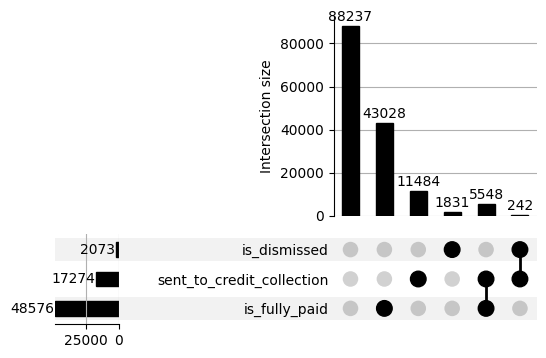

In [9]:
from upsetplot import UpSet, from_indicators

UpSet(from_indicators(['is_dismissed', 'is_fully_paid', 'sent_to_credit_collection'],
data=case_log),
show_counts=True).plot()

- *b)* 
    - Most cases (88,237) did not result in dismissal, full payment, or credit collection (all boolean features are False).
    - A large number of cases (43,028) have been fully paid, without being dismissed or sent to credit collection.
    - There are smaller groups of cases that were either dismissed, sent to credit collection, or paid, with varying combinations of these outcomes.

## Task 6


In [12]:
df = case_log.groupby('case:concept:name').agg(
    initial_fine_amount=('initial_fine_amount', 'max'),
    final_outstanding_payment=('final_outstanding_payment', 'max'))

fig3 = px.scatter(df, 
                 x='initial_fine_amount', 
                 y='final_outstanding_payment', 
                 title='Scatter Plot of Initial Fine Amount vs Final Outstanding Balance',
                 labels={'initial_fine_amount':'Initial Fine Amount', 
                         'final_outstanding_payment':'Final Outstanding Balance'},
                 width=700)

fig3.show()

- For initial fines in the lower range (below 1000), there seems to be a loose positive correlation between the initial fine amount and the final outstanding balance. As the fine increases, there is a tendency for the final balance to be positive, suggesting that larger fines are more likely to have an outstanding balance.

- There are a few outliers where the final outstanding balance is significantly high, even when the initial fine was not that large. For example, cases with an initial fine around 0 have a final outstanding balance exceeding 5,000. These might be cases where interest or penalties accumulated over time, or the case was sent to credit collection.

- A few points have negative final outstanding balances, indicating overpayment or cases where fines were reduced or dismissed.


## Task 7
- The employee with resource 29 handled 18% of all cases where the org:resource entry is not missing. This employee deducted a minimum of 2 points and a median of 5 points from offenders driving licences.

- 58/66 cases where 10 points (which is the highest amount in the log) where deducted from the offender, violated article number 142. After some research we found out that following article 142 10 points are deducted when exceeding speed limits by more than 60 km/h

# Session 3

## Task 1

- *a)* 
    - *Variant 1:* This process involves creating a fine, followed by a series of steps such as sending the fine, inserting a fine notification, adding a penalty, and finally sending the fine for credit collection.
    - *Variant 2:* This process is much shorter, involving creating a fine and then immediately payment within a short time.
    - *Variant 3:* This variant consists of creating a fine and then sending the fine with a significant delay.
    - *Variant 4:* This variant involves creating a fine, sending the fine with a delay, inserting a fine notification, adding a penalty and finally a payment by the offender.

    Unexpected behaviour:   
    - In variant 2 the fine is immediatly payed without it being sent, how is the offender informed about the violation?
    - In all the variants 1,3,4 the interval between fine creation and it being sent is mostly over 100 days, why does it take so long?

- *b)* 88.29%
- *c)* <img src="images/process_map.png" alt="Alt Text" style="width: 500px;"/>


## Task 2

- *a)* 
    - *Observation 1:* Out of the 79'860 fine notifications, only 3'891 are directly paid while 72'334 are added a penalty. This suggests that only about 4.9% of individuals pay their fines directly upon receiving a notification, while 90.6% of cases end up accruing penalties. This is an alarmingly low direct payment rate, raising concerns about the efficiency of the current system in prompting immediate compliance. Investigating the reasons for this low payment rate (e.g., communication issues, inability to pay, or lack of consequences for delays) could help improve the system and reduce the need for adding penalties and further administrative actions.

    - *Observation 2:* Most of the cases with added penalty are sent to credit collection and only a small part is paid directly. This suggests that the process of sending cases to credit collection is the primary mechanism used to resolve unpaid fines with added penalties, instead of direct payments. This heavy reliance on credit collection is likely a costly and resource-intensive process, involving legal and administrative fees, which could strain the system. It would be valuable to investigate whether measures can be taken to encourage earlier payments (e.g., reminders, incentives, flexible payment plans) before fines escalate to the collection stage. This could save resources and reduce the need for costly enforcement actions.

    - *Observation 3:* There is a surprisingly high number of cases (97,182) being sent to "Control Collection" after appeal actions. This suggests that many appeals are not being resolved in favor of the individual or that many cases are moving directly to enforcement, bypassing other steps. This might indicate inefficiencies in the appeal process, leading to excessive forwarding to collections or improper handling of appeals.

- *b)* Create Fine → Payment → Send Fine 
- *c)* This is quite difficult to answer but a possible explanation could be that the individual might have proactively paid the fine before the formal notification was sent. In some systems, people are aware of fines (for example, through online portals or informal communication), and they can pay them directly without waiting for the official fine letter.

## Task 3

<img src="images/repeated_activities.png" alt="Alt Text" style="width: 800px;"/>

- *a)* see the first column in the screenshot
- *b)* see the second column in the screenshot
- *c)* 
    - *2 occurences:* S92963


        Fine Issued and Notified: The fine was issued on June 27, 2004, for 68.25 units. It wasn’t sent to the person right away—it took until November 22, 2004 for the fine to be sent, and a formal notification was recorded on December 2, 2004.

        Penalty Added: On January 31, 2005, an additional penalty of 137.55 units was added to the case, increasing the total fine quite significantly. This penalty may have been added due to late action or non-payment by the due date.

        First Payment:The person made a first payment of 79.25 units on February 11, 2005, but this didn’t cover the full amount owed.

        Appeal to Judge: Instead of fully settling the case, the person decided to appeal to a judge on June 27, 2005. This likely indicates they weren’t happy with the fine or the added penalty and wanted to challenge it legally.

        Final Payment: On December 12, 2005, the person made a second and final payment of 148.55 units, likely closing out the case.
        
    - *5 occurences:*  V9576
    
        Fine Issuance and Notification: On July 31, 2002, the individual was fined an amount of 131.0 units for a traffic violation. A few months later, on October 25, 2002, the fine was officially sent to the individual, and by November 4, 2002, a notification regarding the fine was recorded in the system.

        Appeal Process: Rather than paying the fine immediately, the individual chose to appeal the fine. The appeal process began when the date of appeal to the prefecture was recorded on November 13, 2002, and the appeal was officially sent to the prefecture on December 2, 2002.

        Additional Penalty: On January 3, 2003, while the appeal was still under review, an additional penalty of 262.0 units was added to the original fine, which significantly increased the total amount owed.

        Appeal Result: The result of the appeal came back from the prefecture on February 28, 2003, and the individual was informed of the outcome on April 23, 2003. It seems that the appeal was unsuccessful because, soon after, on May 2, 2003, the individual escalated the matter further by appealing to a judge.
        
        Payments: Over the following year, the individual made six payments in multiple installments, starting on May 3, 2004 and ending on October 5, 2004. The payments gradually increased the amount settled, starting from 24.36 units and reaching a final total of 146.16 units by the end of the payment process.

## Task 4

The svg and bpmn files are in the files folder and can be downloaded by clicking the links below.


In [2]:
from IPython.display import display, HTML

# Create download links for BPMN and SVG files
html_content = """
<a href="files/RTFM-Template.bpmn" download>Download BPMN File</a><br>
<a href="files/diagram.svg" download>Download SVG File</a>
"""
display(HTML(html_content))


## Task 5

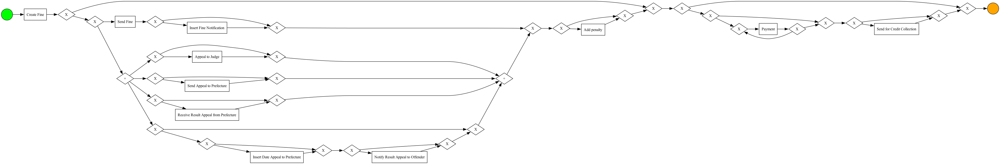

In [8]:
bpmn_model = pm4py.discover_bpmn_inductive(event_log, noise_threshold=0.1)
pm4py.view_bpmn(bpmn_model)

There are a number of traces that are not that common our handmade BPMN model covers the most usual traces only. Here are two traces of the generated model that are not present in our model from task 4.
 - We did not consider cases where the fine is not sent before being paid
 - We did not consider cases where the trace does not follow the strict sequence "Insert date appeal to prefecture -> Send Appeal to Prefecture -> Receive Result Appeal from Prefecture -> Notify Result Appeal to Offender". In the generated BPMN model, this actions can happen in any order.

# Session 5

## Task 1

- *a)* Condition to check: "Insert Fine Notification is always followed by Add penalty."

In [17]:
declare_model_a = {'response': {('Insert Fine Notification', 'Add penalty'): None}}
conf_result_a = pm4py.conformance_declare(event_log, declare_model_a, return_diagnostics_dataframe=True)
# Filter for cases that have at least one deviation (i.e., where the response constraint is violated)
non_conforming_cases_a = conf_result_a[conf_result_a['no_dev_total'] > 0]

negatives = conf_result_a[conf_result_a['dev_fitness'] < 1.0]
print('Rule A - Fitness:', conf_result_a['dev_fitness'].mean(), 'Violations:', len(negatives))
display(negatives[['case_id','dev_fitness']].head(5))

Rule A - Fitness: 1.0 Violations: 0


,case_id,dev_fitness



- *b)* Condition to check: "Insert Date Appeal to Prefecture is always preceded by Send Fine."


In [15]:
declare_model_b = {'precedence': {('Send Fine', 'Insert Date Appeal to Prefecture'): None}}
conf_result_b = pm4py.conformance_declare(event_log, declare_model_b, return_diagnostics_dataframe=True)
violations_b = conf_result_b[conf_result_b['dev_fitness'] < 1.0]

# Display the results
print('Rule B - Fitness:', conf_result_b['dev_fitness'].mean(), 'Violations:', len(violations_b))
display(violations_b[['case_id', 'dev_fitness']].head(5))


Rule B - Fitness: 0.9998536942209217 Violations: 22


,case_id,dev_fitness
21524,A5922,0.0
22246,A7016,0.0
23958,C11327,0.0
24346,C12875,0.0
24938,C14313,0.0


There are 22 cases violating this precedence constraint. one of them is A5922. This case has the following sequence of actions: 

Create Fine -> Insert Date Appeal to Prefecture -> Send Fine -> Insert Fine -> Notification -> Add penalty -> Send Appeal to Prefecture

Since "Insert Date Appeal to Prefecture" happens before "Send Fine", this case violates the rule. The sequence does not follow the expected order of events where the fine should have been sent before any appeal-related action was recorded.

- *c)* Condition to check: "Payment and Send for Credit Collection do not occur together in a case."


In [16]:
declare_model_c = {'not_coexistence': {('Payment', 'Send for Credit Collection'): None}}
conf_result_c = pm4py.conformance_declare(event_log, declare_model_c, return_diagnostics_dataframe=True)
violations_c = conf_result_c[conf_result_c['dev_fitness'] < 1.0]

# Display the results
print('Rule C - Fitness:', conf_result_c['dev_fitness'].mean(), 'Violations:', len(violations_c))
display(violations_c[['case_id', 'dev_fitness']].head(5))

Rule C - Fitness: 1.0 Violations: 0


,case_id,dev_fitness


    
## Task 2
"Send Fine" is always preceded by "Create Fine"


In [28]:
declare_model = {'precedence': {('Create Fine', 'Send Fine'): None}}
conf_result = pm4py.conformance_declare(event_log, declare_model, return_diagnostics_dataframe=True)
violations = conf_result_b[conf_result_b['dev_fitness'] < 1.0]

# Display the results
print('Rule B - Fitness:', conf_result['dev_fitness'].mean(), 'Violations:', len(violations))
display(violations[['case_id', 'dev_fitness']].head(5))

Rule B - Fitness: 1.0 Violations: 22


,case_id,dev_fitness
21524,A5922,0.0
22246,A7016,0.0
23958,C11327,0.0
24346,C12875,0.0
24938,C14313,0.0


It would make sense that a fine has to be created before it can be sent, but in 22 cases this doesn't apply. In most these cases this is because the fine is not sent directly after being created but "Insert date appeal to prefecture" happens in between.

## Task 3
First we need to convert the BPMN model from 3.5 to Petri Net

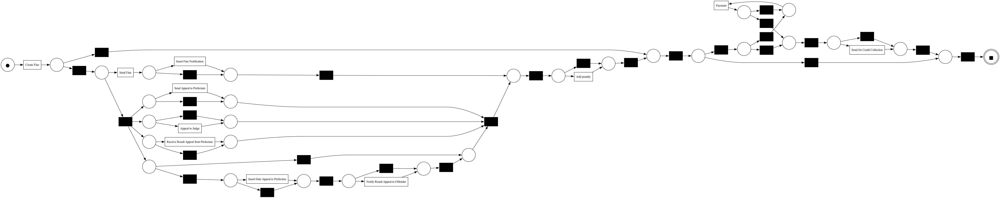

In [30]:
(pn, im, fm) = pm4py.objects.conversion.bpmn.variants.to_petri_net.apply(bpmn_model, parameters=None)
pm4py.view_petri_net(pn, im, fm)

Now we can calculate the fitness of the Event Log against the Petri Net using token-based replay.

In [31]:
display(pm4py.fitness_token_based_replay(event_log, pn, im, fm))
display(pm4py.fitness_alignments(event_log, pn, im, fm))

replaying log with TBR, completed traces :: 100%|██████████| 231/231 [00:01<00:00, 227.92it/s]


{'perc_fit_traces': 93.9628915342156,
 'average_trace_fitness': 0.9942532355647234,
 'log_fitness': 0.9934270735146189,
 'percentage_of_fitting_traces': 93.9628915342156}

aligning log, completed variants :: 100%|██████████| 231/231 [00:02<00:00, 115.03it/s]


{'percFitTraces': 93.9628915342156,
 'averageFitness': 0.9870661806910803,
 'percentage_of_fitting_traces': 93.9628915342156,
 'average_trace_fitness': 0.9870661806910803,
 'log_fitness': 0.9799162447989826}

Next we check for deviations from the model by creating alignments and printing those with fitness less than 1.0. It helps identify which specific events in the log do not conform to the Petri net.

In [32]:
diagnostics = pm4py.conformance_diagnostics_alignments(event_log, pn, im, fm)
for item in diagnostics:
    if item['fitness'] < 1.0:
        print('fitness', item['fitness'])
        for (log_move, model_move) in item['alignment']:
            print('log:', log_move, '; normative model:', model_move)

aligning log, completed variants :: 100%|██████████| 231/231 [00:02<00:00, 113.85it/s]


fitness 0.7142857142857143
log: Create Fine ; normative model: Create Fine
log: >> ; normative model: None
log: Send Fine ; normative model: Send Fine
log: Insert Fine Notification ; normative model: Insert Fine Notification
log: Insert Date Appeal to Prefecture ; normative model: >>
log: >> ; normative model: None
log: >> ; normative model: None
log: Add penalty ; normative model: Add penalty
log: Send Appeal to Prefecture ; normative model: >>
log: >> ; normative model: None
log: >> ; normative model: None
log: >> ; normative model: None
log: >> ; normative model: None
fitness 0.7142857142857143
log: Create Fine ; normative model: Create Fine
log: >> ; normative model: None
log: Send Fine ; normative model: Send Fine
log: Insert Fine Notification ; normative model: Insert Fine Notification
log: >> ; normative model: None
log: >> ; normative model: None
log: Add penalty ; normative model: Add penalty
log: Insert Date Appeal to Prefecture ; normative model: >>
log: Send Appeal to Prefe


- *a)* 
- *b)* 

## Task 4
Let's define the Enrichement Functions.

For a we'll check if the outstanding balance after each event is 0 or less, and ensure no further events exist after that point for the same case.

In [21]:
def check_outstanding_balance(log_data):
    # Create a boolean series for violations
    log_data = log_data.sort_values(by=['case:concept:name', 'time:timestamp'])
    log_data['violation'] = (log_data['outstanding_balance'] <= 0).shift(1) & (log_data['outstanding_balance'] > 0)
    
    # Get violating cases
    violating_cases = log_data.loc[log_data['violation'], 'case:concept:name'].unique()
    return violating_cases

For b, we''ll check if the appeal is raised within 60 days of the "Insert Fine Notification."

In [22]:
def check_appeal_timing(log_data):
    # Create a DataFrame to hold the first fine insert dates for each case
    fine_insert_dates = log_data[log_data['notificationType'] == 'Insert Fine Notification'] \
        .groupby('case:concept:name')['time:timestamp'].min().reset_index()
    fine_insert_dates.columns = ['case:concept:name', 'fine_insert_date']
    
    # Merge with the main log to check appeal dates
    appeals = log_data[log_data['notificationType'] == 'Appeal to Prefecture']
    appeals = appeals.merge(fine_insert_dates, on='case:concept:name')
    
    # Calculate the difference in days
    appeals['days_difference'] = (appeals['time:timestamp'] - appeals['fine_insert_date']).dt.days
    
    # Identify violating cases
    violating_cases = appeals[appeals['days_difference'] > 60]['case:concept:name'].unique()
    return violating_cases


Finally we can call the functions and gather the results.

In [24]:
violations_a = check_outstanding_balance(event_log)
violations_b = check_appeal_timing(event_log)
print(f"Total Violating Cases for statement 1: {len(violations_a)}")

print(f"Total Violating Cases for statement 2: {len(violations_b)}")



Total Violating Cases for statement 1: 75535
Total Violating Cases for statement 2: 0


Let's display the id's of the first five violations of statement one, then we will inpect one of them manually

In [29]:
# Display the first five violating case IDs
first_five_violations = list(violations_a)[:5]
print(f"First Five Violating Case IDs: {first_five_violations}")


First Five Violating Case IDs: ['A10007', 'A10008', 'A10009', 'A1001', 'A1002']


Now we can calculate the fuzzy truth value for statement 1.

In [25]:
def fuzzy_truth_value(log_data, violating_cases):
    total_cases = log_data['case:concept:name'].nunique()
    non_violating_cases = total_cases - len(violating_cases)
    return non_violating_cases / total_cases

In [26]:
fuzzy_value = fuzzy_truth_value(event_log, violations_a)
print(f"Fuzzy Truth Value: {fuzzy_value:.2f}")

Fuzzy Truth Value: 0.50



- *a)* 75535 cases violate this statement. The fuzzy truth value on the case log is 0.5. 
- *b)* The log conforms perfectly to this statement

# Analytics Lists

## Interesting Findings
- The median of the initial fine amount is very distant from the maximum, in fact only 9 entries have an initial fine amount of over 900. 


## Process Improvements 
- All the missing values in the amount and payment columns turned out to be a hurdle for addition and other multiplications so we replaced them with 0.

## Open Questions
- Why are so many cases closed even if the final outstanding payment is not equal to 0?